# Tutorial for Luke

Hi Luke! Welcome to your very own tutorial in the use of R for single-cell analysis!

It is useful to structure your notebooks nicely so other people can follow along. 

I am guilty of not always doing this, but I recommend trying.


You can keep it organised by using subheaders for every part of the analysis, and adding comments to every code. Comments are added with #

I like to indent every line that is part of a big of a bigger code

This is not necessary in R, but it is in python. It helps keep an overview, like this:

In [8]:
# lets say you have a for loop:
for(i in 1:3){
    print(i)
    # and if you have another code you can indent it further
    for(x in c('Test1', 'Test2')){ # c() contains a vector, usually if you want to pass multiple arguments, you'd want to use this
        print(paste0('i = ', i, 'x = ', x)) # paste0 is useful to concatinate strings/numbers to eachother
    }
} # if you hoover your mouse over any bracket it should indicate in green which one it is closing, this is useful for debugging

[1] 1
[1] "i = 1x = Test1"
[1] "i = 1x = Test2"
[1] 2
[1] "i = 2x = Test1"
[1] "i = 2x = Test2"
[1] 3
[1] "i = 3x = Test1"
[1] "i = 3x = Test2"


## Let's try some actual stuff!

#### load packages

In [9]:
suppressPackageStartupMessages({ # this first line makes sure you don't get all the start up messages
    library(data.table) # used for manipulating data
    library(dplyr) # used for the 'pipes'
    library(ggplot2) # used for plotting data
})

#### Data location

In [147]:
# We want to specify as many variables as possible in the very beginning and as few as possible in the actual code
# If you do this, you can reproduce your code for other projects with only having to change the variables in the first block
# Otherwise, you will have to go through the whole code and change all places that have certain variables

io = list() # here we make an object called 'io', standing for input/output, which is an empty list
# now we are going to assign paths to files to this io list
io$main = "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood" # this is the main directory
io$metadata = file.path(io$main, "results/rna/mapping/sample_metadata_after_mapping.txt.gz") # This specifies to a location within the main folder
io$rna_sce = file.path(io$main, "processed/rna/SingleCellExperiment.rds")
io$atac_sce = NULL # will specify later



In [12]:
# this is what io looks like now
io

$main
[1] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood"

$metadata
[1] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/results/rna/mapping/sample_metadata_after_mapping.txt.gz"

$rna_sce
[1] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood//rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/rna/SingleCellExperiment.rds"

First we're going to practice manipulating data using data.table, and plotting using ggplot2

#### Load data

In [14]:
meta = fread(io$metadata) # load metadata using fread
head(meta)

cell,barcode,sample,nFeature_RNA,nCount_RNA,mitochondrial_percent_RNA,ribosomal_percent_RNA,alias,day,genotype,pass_rnaQC,doublet_score,doublet_call,celltype,celltype.score,closest.cell,day_celltype,celltype_genotype
<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<lgl>,<dbl>,<lgl>,<chr>,<dbl>,<chr>,<chr>,<chr>
1A_Eo_DEG_G9_day3#AAACAGCCAAGTGAAC-1,AAACAGCCAAGTGAAC-1,1A_Eo_DEG_G9_day3,602,1007,0.50,25.02,day3_wt_rep1,D3,wt,FALSE,NA,NA,NA,NA,NA,D3-wt,NA-wt
1A_Eo_DEG_G9_day3#AAACAGCCAGCAAGAT-1,AAACAGCCAGCAAGAT-1,1A_Eo_DEG_G9_day3,6110,22923,6.09,10.15,day3_wt_rep1,D3,wt,TRUE,1.15,FALSE,Epiblast,0.84,cell_85485,D3-wt,Epiblast-wt
1A_Eo_DEG_G9_day3#AAACAGCCAGCACCAT-1,AAACAGCCAGCACCAT-1,1A_Eo_DEG_G9_day3,4201,10794,6.57,7.38,day3_wt_rep1,D3,wt,TRUE,0.53,FALSE,Primitive_Streak,0.56,cell_88836,D3-wt,Primitive_Streak-wt
1A_Eo_DEG_G9_day3#AAACATGCAACACCTA-1,AAACATGCAACACCTA-1,1A_Eo_DEG_G9_day3,680,1195,2.68,23.51,day3_wt_rep1,D3,wt,FALSE,NA,NA,NA,NA,NA,D3-wt,NA-wt
1A_Eo_DEG_G9_day3#AAACATGCAAGTAAGC-1,AAACATGCAAGTAAGC-1,1A_Eo_DEG_G9_day3,3659,8745,5.74,11.92,day3_wt_rep1,D3,wt,TRUE,0.31,FALSE,Epiblast,0.88,cell_1799,D3-wt,Epiblast-wt
1A_Eo_DEG_G9_day3#AAACATGCAATATACC-1,AAACATGCAATATACC-1,1A_Eo_DEG_G9_day3,3640,8461,3.70,7.21,day3_wt_rep1,D3,wt,TRUE,0.16,FALSE,Primitive_Streak,0.72,cell_43612,D3-wt,Primitive_Streak-wt


the structure of data.table filtering is the following

dt[row filter, col filter, by filter] 

I'll give examples below

#### filtering

In [55]:
# oh noo! some entries didn't pass RNA QC (see column pass_rnaQC) or are called as doublets
# let's filter those out first
meta = meta[pass_rnaQC == TRUE & doublet_call == FALSE]

# You can also indicate you want to select the opposite of the filter by adding ! in front
# meta[!pass_rnaQC==TRUE] will select only rows that fail QC in this case

In [56]:
head(meta)

cell,barcode,sample,nFeature_RNA,nCount_RNA,mitochondrial_percent_RNA,ribosomal_percent_RNA,alias,day,genotype,pass_rnaQC,doublet_score,doublet_call,celltype,celltype.score,closest.cell,day_celltype,celltype_genotype,Ncells
<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<lgl>,<dbl>,<lgl>,<chr>,<dbl>,<chr>,<chr>,<chr>,<int>
1A_Eo_DEG_G9_day3#AAACAGCCAGCAAGAT-1,AAACAGCCAGCAAGAT-1,1A_Eo_DEG_G9_day3,6110,22923,6.09,10.15,day3_wt_rep1,D3,wt,TRUE,1.15,FALSE,Epiblast,0.84,cell_85485,D3-wt,Epiblast-wt,752
1A_Eo_DEG_G9_day3#AAACAGCCAGCACCAT-1,AAACAGCCAGCACCAT-1,1A_Eo_DEG_G9_day3,4201,10794,6.57,7.38,day3_wt_rep1,D3,wt,TRUE,0.53,FALSE,Primitive_Streak,0.56,cell_88836,D3-wt,Primitive_Streak-wt,5405
1A_Eo_DEG_G9_day3#AAACATGCAAGTAAGC-1,AAACATGCAAGTAAGC-1,1A_Eo_DEG_G9_day3,3659,8745,5.74,11.92,day3_wt_rep1,D3,wt,TRUE,0.31,FALSE,Epiblast,0.88,cell_1799,D3-wt,Epiblast-wt,752
1A_Eo_DEG_G9_day3#AAACATGCAATATACC-1,AAACATGCAATATACC-1,1A_Eo_DEG_G9_day3,3640,8461,3.70,7.21,day3_wt_rep1,D3,wt,TRUE,0.16,FALSE,Primitive_Streak,0.72,cell_43612,D3-wt,Primitive_Streak-wt,5405
1A_Eo_DEG_G9_day3#AAACATGCAATCCTGA-1,AAACATGCAATCCTGA-1,1A_Eo_DEG_G9_day3,3632,8276,4.60,8.16,day3_wt_rep1,D3,wt,TRUE,0.21,FALSE,Epiblast,0.52,cell_106685,D3-wt,Epiblast-wt,752
1A_Eo_DEG_G9_day3#AAACATGCACTTAGGC-1,AAACATGCACTTAGGC-1,1A_Eo_DEG_G9_day3,4878,15676,7.34,8.97,day3_wt_rep1,D3,wt,TRUE,0.64,FALSE,Primitive_Streak,0.40,cell_28316,D3-wt,Primitive_Streak-wt,5405


In [57]:
# how many rows:
nrow(meta)
# how many cols:
ncol(meta)
# summary of a specific column:
summary(meta$doublet_score)
# table of how many cells have a certain value
table(meta$celltype)
# or celltype and genotype combinations
table(meta$celltype, meta$genotype)

[1] 38346

[1] 19

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0000  0.0900  0.2400  0.3349  0.4900  1.2500 


                     Allantois      Anterior_Primitive_Streak 
                          3910                            462 
           Blood_progenitors_1            Blood_progenitors_2 
                           107                            176 
               Caudal_epiblast                Caudal_Mesoderm 
                            58                              5 
                 Def._endoderm                    Endothelium 
                            51                            500 
                      Epiblast                     Erythroid1 
                           752                            103 
                    Erythroid2                   ExE_endoderm 
                             4                              2 
                  ExE_mesoderm   Forebrain_Midbrain_Hindbrain 
                          5441                             64 
                           Gut Haematoendothelial_progenitors 
                            47                        

                                
                                 eomes_ko   wt
  Allantois                          2828 1082
  Anterior_Primitive_Streak            39  423
  Blood_progenitors_1                   0  107
  Blood_progenitors_2                   0  176
  Caudal_epiblast                      36   22
  Caudal_Mesoderm                       1    4
  Def._endoderm                        35   16
  Endothelium                         243  257
  Epiblast                              2  750
  Erythroid1                            0  103
  Erythroid2                            0    4
  ExE_endoderm                          2    0
  ExE_mesoderm                       3953 1488
  Forebrain_Midbrain_Hindbrain         38   26
  Gut                                  43    4
  Haematoendothelial_progenitors      712 2221
  Intermediate_mesoderm              1236  450
  Mesenchyme                          287 1270
  Mixed_mesoderm                      870 3022
  Nascent_mesoderm         

In [58]:
# Let's say you want to filter to specific columns, because this is too messy
meta_small = meta[,c('cell', 'day', 'genotype', 'celltype')]

In [59]:
tail(meta_small, 2) # the 2 indicates the number of rows you want to see

cell,day,genotype,celltype
<chr>,<chr>,<chr>,<chr>
rv_eo_deg_day4_dtag#TTTGTGTTCATTTGTC-1,D4,eomes_ko,Allantois
rv_eo_deg_day4_dtag#TTTGTTGGTACTTAGG-1,D4,eomes_ko,Mesenchyme


In [60]:
# of course, you can combine row and column filters
# you can also filter rows by two columns at the same time! 
meta_small = meta[celltype == 'Epiblast' & genotype == 'wt',c('cell', 'day', 'genotype', 'celltype')]
tail(meta_small, 2)

cell,day,genotype,celltype
<chr>,<chr>,<chr>,<chr>
rv_eo_deg_day3_5_control#ACAGGCTGTTACGCAA-1,D3.5,wt,Epiblast
rv_eo_deg_day3_5_control#CACTAAGGTTATCCTA-1,D3.5,wt,Epiblast


In [61]:
# There are multiple combinations of filters, and: &, and or: | 
# so let's say we want cells where the celltype is Epiblast OR Primitive_Streak
meta_small = meta[celltype == 'Epiblast' | celltype == 'Primitive_Streak',c('cell', 'day', 'genotype', 'celltype')]
head(meta_small, 2)

cell,day,genotype,celltype
<chr>,<chr>,<chr>,<chr>
1A_Eo_DEG_G9_day3#AAACAGCCAGCAAGAT-1,D3,wt,Epiblast
1A_Eo_DEG_G9_day3#AAACAGCCAGCACCAT-1,D3,wt,Primitive_Streak


In [62]:
# these arguments can also be split up using pipes
meta_small = meta %>% # this is a pipe
    .[celltype == 'Epiblast'| celltype == 'Primitive_Streak'] %>% # the . in front indicate that the next filter continues on the previous one
    .[,c('cell', 'day', 'genotype', 'celltype')]
# in this case, the output is the exact same as the block above
# In other cases this can be really useful, as I will show below

In [63]:
# get the gist?

In [65]:
# We have done some filtering
meta_small = meta[,c('cell', 'day', 'genotype', 'celltype', 'closest.cell')]

# Now let's  try to do some more manipulations using the 'by' argument
cells_per_celltype = meta_small %>% # from meta small
    .[,Ncells:=.N, by='celltype'] %>% # make a new column using :=, where the values are .N (number of rows), by celltype
    unique(by='celltype') # now we filter unique so each celltype has only one column, otherwise it would be the same dt as meta_small, but with an added column

head(cells_per_celltype)

cell,day,genotype,celltype,closest.cell,Ncells
<chr>,<chr>,<chr>,<chr>,<chr>,<int>
1A_Eo_DEG_G9_day3#AAACAGCCAGCAAGAT-1,D3,wt,Epiblast,cell_85485,752
1A_Eo_DEG_G9_day3#AAACAGCCAGCACCAT-1,D3,wt,Primitive_Streak,cell_88836,5405
1A_Eo_DEG_G9_day3#AAACCAACATCATGTG-1,D3,wt,Anterior_Primitive_Streak,cell_87312,462
1A_Eo_DEG_G9_day3#AAAGCAAGTCGTTACT-1,D3,wt,Nascent_mesoderm,cell_111913,9174
1A_Eo_DEG_G9_day3#AACGCCCAGCTGTCAG-1,D3,wt,Forebrain_Midbrain_Hindbrain,cell_102107,64
1A_Eo_DEG_G9_day3#AAGCGCTGTTTATTCG-1,D3,wt,Rostral_neurectoderm,cell_111114,144


In [81]:
# now let's try to plot this using ggplot
# format: ggplot(data.table, aes(X-axis, Y-axis, col=column to color by, size = color to size by)) + 
#                geom_point/line/bar/violin()
p = ggplot(cells_per_celltype, aes(celltype, Ncells, fill=celltype)) + 
    geom_point()

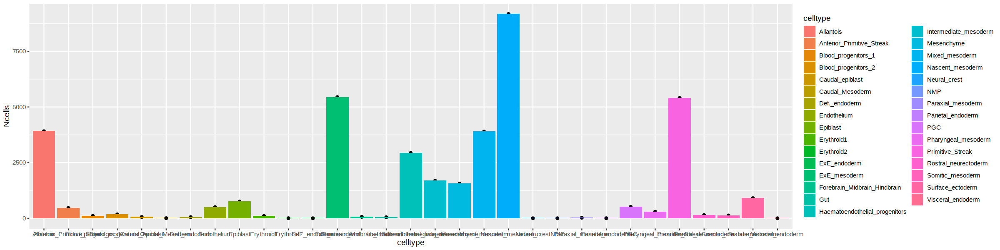

In [82]:
# bar plot makes more sense here, we can add this to the existing ggplot object
p = p + geom_bar(stat='identity')

# We can also change the dimensions at which it is displayed in jupyterlab
options(repr.plot.width=20, repr.plot.height=5)
p

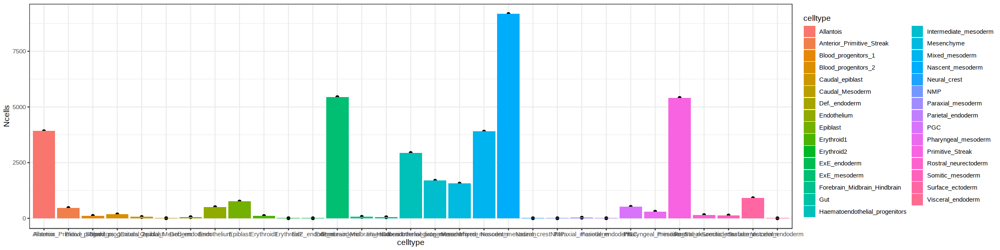

In [83]:
# now let's improve the theme
# usally, theme_bw is nice
p + theme_bw()

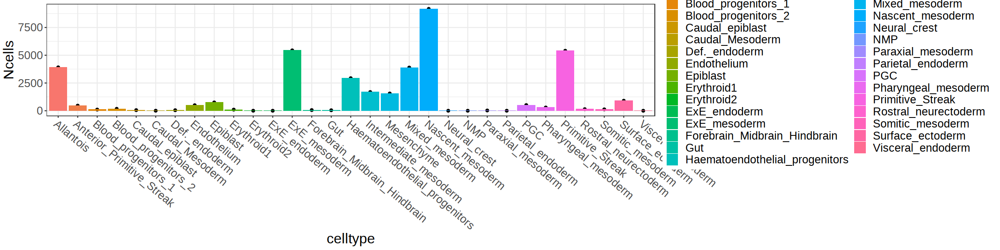

In [84]:
# but we have to make more changes to make it look decent. 
# there is a lot of flexibility with the aesthethics that you will figure out in due time
p = p +
    theme_bw() + 
    theme(text = element_text(size=20),
          axis.text.x = element_text(angle=-40, vjust=1, hjust=0))


p

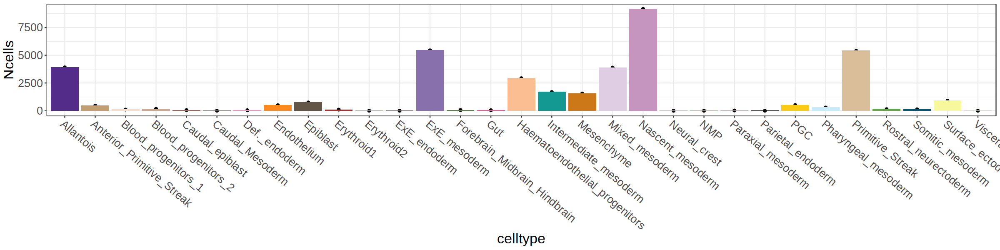

In [88]:
# We can add colours as well if you really want! 
# this is the colour scheme, we usually keep this in a seperate file that we then call in our notebooks
celltype.colors = c(
  "Epiblast" = "#635547",
  "Primitive_Streak" = "#DABE99",
  "Caudal_epiblast" = "#9e6762",
  "PGC" = "#FACB12",
  "Anterior_Primitive_Streak" = "#c19f70",
  "Notochord" = "#0F4A9C",
  "Def._endoderm" = "#F397C0",
  "Gut" = "#EF5A9D",
  "Nascent_mesoderm" = "#C594BF",
  "Mixed_mesoderm" = "#DFCDE4",
  "Intermediate_mesoderm" = "#139992",
  "Caudal_Mesoderm" = "#3F84AA",
  "Paraxial_mesoderm" = "#8DB5CE",
  "Somitic_mesoderm" = "#005579",
  "Pharyngeal_mesoderm" = "#C9EBFB",
  "Cardiomyocytes" = "#B51D8D",
  "Allantois" = "#532C8A",
  "ExE_mesoderm" = "#8870ad",
  "Mesenchyme" = "#cc7818",
  "Haematoendothelial_progenitors" = "#FBBE92",
  "Endothelium" = "#ff891c",
  "Blood_progenitors" = "#c9a997",
  "Blood_progenitors_1" = "#f9decf",
  "Blood_progenitors_2" = "#c9a997",
  "Erythroid" = "#EF4E22",
  "Erythroid1" = "#C72228",
  "Erythroid2" = "#f79083",
  "Erythroid3" = "#EF4E22",
  "NMP" = "#8EC792",
  "Neurectoderm" = "#65A83E",
  "Rostral_neurectoderm" = "#65A83E",
  "Caudal_neurectoderm" = "#354E23",
  "Neural_crest" = "#C3C388",
  "Forebrain_Midbrain_Hindbrain" = "#647a4f",
  "Spinal_cord" = "#CDE088",
  "Surface_ectoderm" = "#f7f79e",
  "Visceral_endoderm" = "#F6BFCB",
  "ExE_endoderm" = "#7F6874",
  "ExE_ectoderm" = "#989898",
  "Parietal_endoderm" = "#1A1A1A"
)

p + scale_fill_manual(values=celltype.colors) + 
    theme(legend.position='none') # legend is not needed, because it says the celltype below. Can also be set to left, bottom, top, right

In [91]:
# I guess we want to compare WT with KD right?
cells_per_celltype_genotype = meta_small %>% # from meta small
    .[,Ncells:=.N, by=c('celltype', 'genotype')] %>% # by celltype AND genotype, in a vector (c()), because we're passing multiple arguments
    unique(by=c('celltype', 'genotype'))

In [92]:
head(cells_per_celltype_genotype)

cell,day,genotype,celltype,closest.cell,Ncells
<chr>,<chr>,<chr>,<chr>,<chr>,<int>
1A_Eo_DEG_G9_day3#AAACAGCCAGCAAGAT-1,D3,wt,Epiblast,cell_85485,750
1A_Eo_DEG_G9_day3#AAACAGCCAGCACCAT-1,D3,wt,Primitive_Streak,cell_88836,4988
1A_Eo_DEG_G9_day3#AAACCAACATCATGTG-1,D3,wt,Anterior_Primitive_Streak,cell_87312,423
1A_Eo_DEG_G9_day3#AAAGCAAGTCGTTACT-1,D3,wt,Nascent_mesoderm,cell_111913,7085
1A_Eo_DEG_G9_day3#AACGCCCAGCTGTCAG-1,D3,wt,Forebrain_Midbrain_Hindbrain,cell_102107,26
1A_Eo_DEG_G9_day3#AAGCGCTGTTTATTCG-1,D3,wt,Rostral_neurectoderm,cell_111114,114


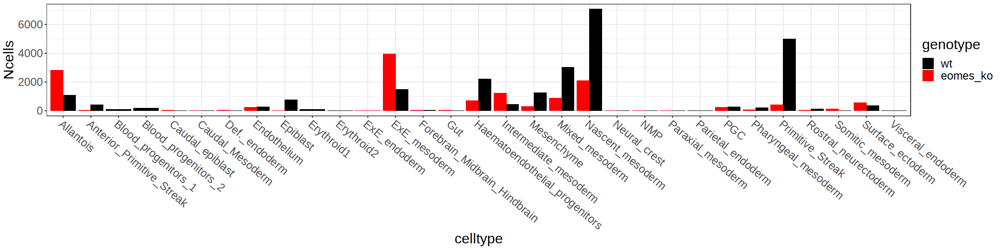

In [94]:
p = ggplot(cells_per_celltype_genotype, aes(celltype, Ncells, fill=genotype)) + 
        geom_bar(stat='identity', position='dodge') + # plot genotypes next to each other instead of on top
        scale_fill_manual(values=c('wt'='black', 'eomes_ko'='red')) + 
        theme_bw() + 
        theme(text = element_text(size=20),
            axis.text.x = element_text(angle=-40, vjust=1, hjust=0))
p

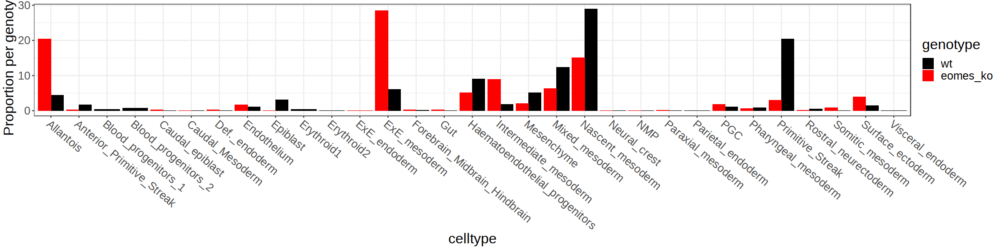

In [101]:
# let's make it a bit more complex, and calculate the proportions of cells instead of total cells
# Proportions have to be calculated per genotype
cells_per_celltype_genotype = cells_per_celltype_genotype %>%
    .[,Ncells_genotype:=sum(Ncells), by='genotype'] %>% # new column with total number of cells per genotype
    .[,prop:=Ncells/Ncells_genotype*100] # proportion is now Ncells (per celltype & genotype) divided by Ncells per genotype * 100, with a total of 100% per genotype

p = ggplot(cells_per_celltype_genotype, aes(celltype, prop, fill=genotype)) + 
        geom_bar(stat='identity', position='dodge') + # plot genotypes next to each other instead of on top
        scale_fill_manual(values=c('wt'='black', 'eomes_ko'='red')) + 
        theme_bw() + 
        theme(text = element_text(size=20),
            axis.text.x = element_text(angle=-40, vjust=1, hjust=0))

p + ylab('Proportion per genotype') # modify the label of the yaxis

In [ ]:
# Pretty cool right!

In [102]:
# let's try to project our data on the UMAP of the atlas

# mapping is already done, with the nearest.cell column indicating the closest cell in the atlas

# let's load some atlas data:

# Atlas # normally locations would be specified above!
io$atlas_in = '/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation/pijuansala2019_gastrulation10x'
# plot original atlas projection to make comprehensible
atlas_meta = fread(file.path(io$atlas_in, 'sample_metadata.txt.gz'))
atlas_meta = atlas_meta[atlas_meta$doublet==FALSE & atlas_meta$stripped==FALSE,]
atlas_umap <- atlas_meta[, c('cell', 'umapX', 'umapY')]

In [103]:
head(atlas_umap)

cell,umapX,umapY
<chr>,<dbl>,<dbl>
cell_1,-10.2275459,-2.8816875
cell_10,-11.2435319,-0.8761099
cell_100,-10.9044295,-0.9639773
cell_1000,-2.9437001,-0.7820226
cell_10000,-7.3668170,-2.2819553
cell_100000,-0.9185215,-5.5175930


In [106]:
# We can merge the closest.cell from our metadata with the cell column from the atlas
umap_projection = merge(meta_small, atlas_umap, by.x='closest.cell', by.y='cell') # if the column name is the same, you can just use by, instead of by.x and by.y

head(umap_projection, 5) # you can see the first 5 cells are all mapped to the same cell of the atlas

closest.cell,cell,day,genotype,celltype,Ncells,umapX,umapY
<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<dbl>,<dbl>
cell_1000,1A_Eo_DEG_G9_day3#AGGTTTATCTTAGGGT-1,D3,wt,Primitive_Streak,4988,-2.9437,-0.7820226
cell_1000,1B_Eo_DEG_G9_day3#AGCTGCTCACCAACCG-1,D3,wt,Primitive_Streak,4988,-2.9437,-0.7820226
cell_1000,2_Eo_DEG_G9_day3_5_VC#CAACCGGGTTGGATCA-1,D3.5,wt,Primitive_Streak,4988,-2.9437,-0.7820226
cell_1000,2_Eo_DEG_G9_day3_5_VC#CGAACCGGTACAAAGA-1,D3.5,wt,Primitive_Streak,4988,-2.9437,-0.7820226
cell_1000,2_Eo_DEG_G9_day3_5_VC#CTTCAAGCATTAGGTT-1,D3.5,wt,Primitive_Streak,4988,-2.9437,-0.7820226


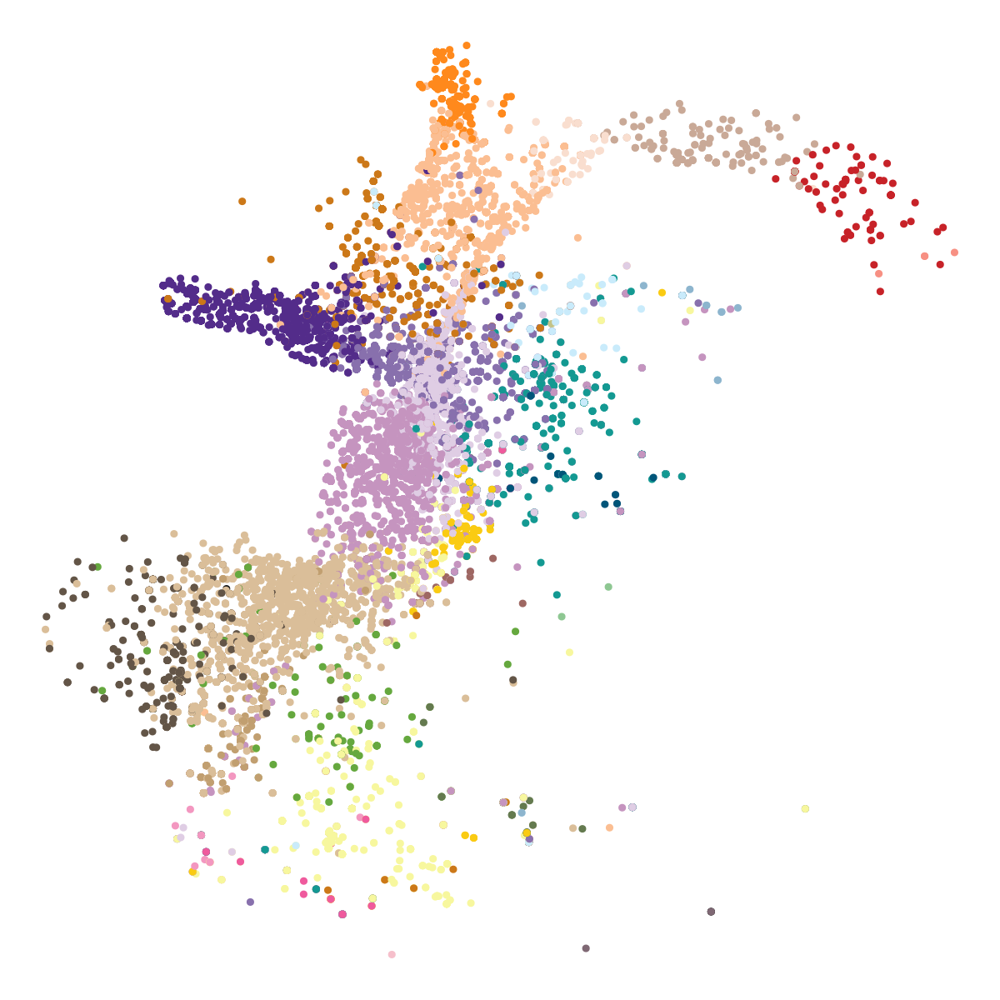

In [111]:
# let's plot
options(repr.plot.width=10, repr.plot.height=10)

ggplot(umap_projection, aes(umapX, umapY, col=celltype)) + 
    geom_point() +
    scale_color_manual(values=celltype.colors) + 
    theme_void() + 
    theme(legend.position='none')

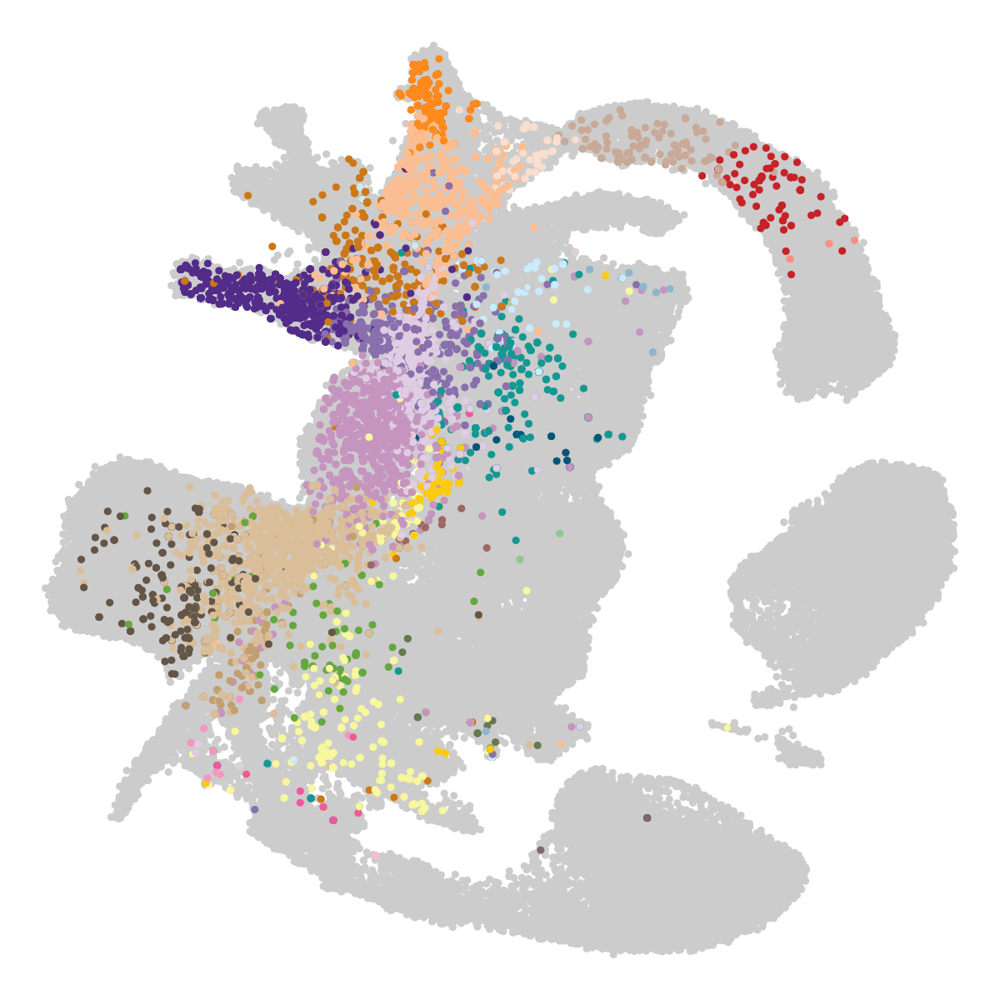

In [115]:
# let's plot
# let's add the atlas as a background in gray

ggplot(umap_projection, aes(umapX, umapY, col=celltype)) + 
    geom_point(data=atlas_umap, col='grey80') + # will automatically use the aes from above, have to overwrite the color to gray
    geom_point() +
    scale_color_manual(values=celltype.colors) + 
    theme_void() + 
    theme(legend.position='none')

In [126]:
# let's try to add a label as text in the middle of each celltype
labels = umap_projection %>%
    .[,`:=`(meanumapX = mean(umapX), meanumapY = mean(umapY)), by='celltype'] %>% # `:=` for multiple new columns
    unique(by='celltype')

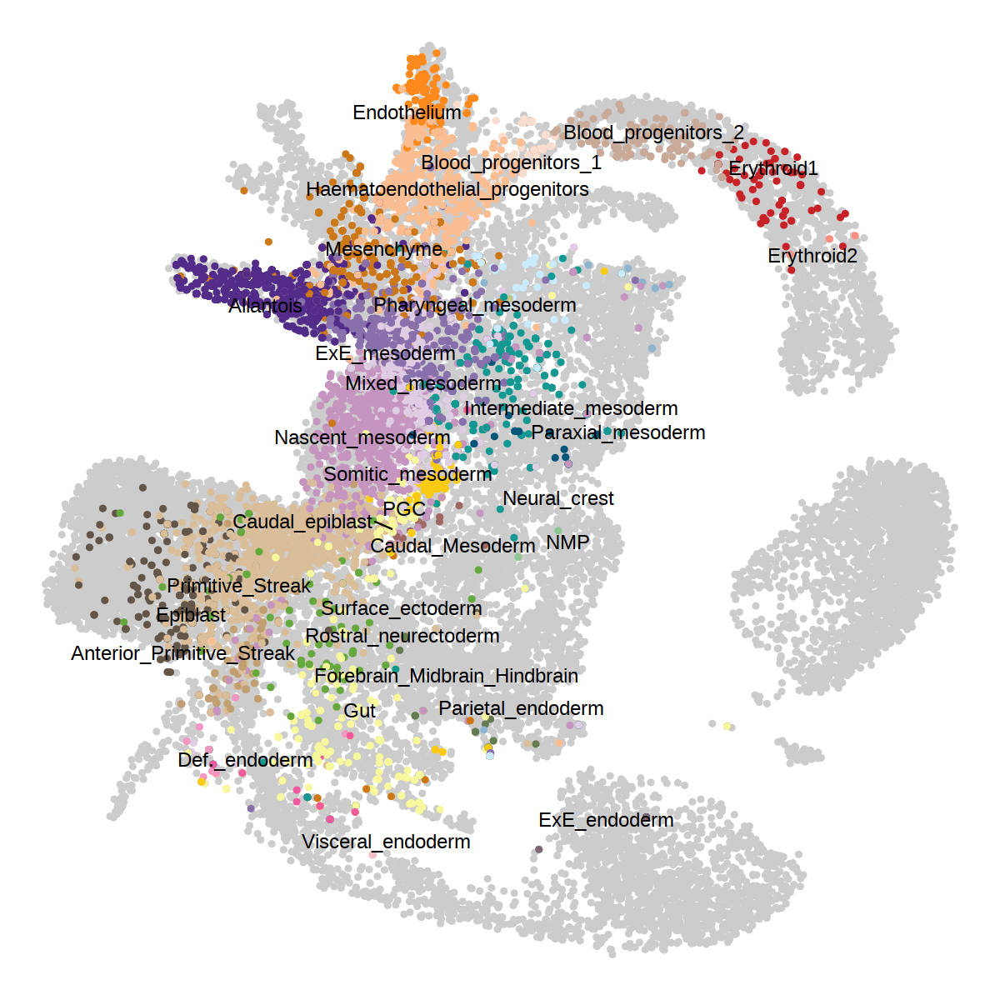

In [212]:
ggplot(umap_projection, aes(umapX, umapY, col=celltype)) + 
    geom_point(data=atlas_umap[sample(nrow(atlas_umap), 20000)], col='grey80') + # now we sample a random subset of 20k cells from the atlas so we don't have to load too much data
    geom_point() +
    ggrepel::geom_text_repel(data=labels, aes(meanumapX, meanumapY, label=celltype), # we didn't load the package ggrepel, but can still use a specific function of it if we add ggrepel:: in front of it
                             col='black', 
                             size=5) + 
    scale_color_manual(values=celltype.colors) + 
    theme_void() + 
    theme(legend.position='none')

# pretty nice right? 

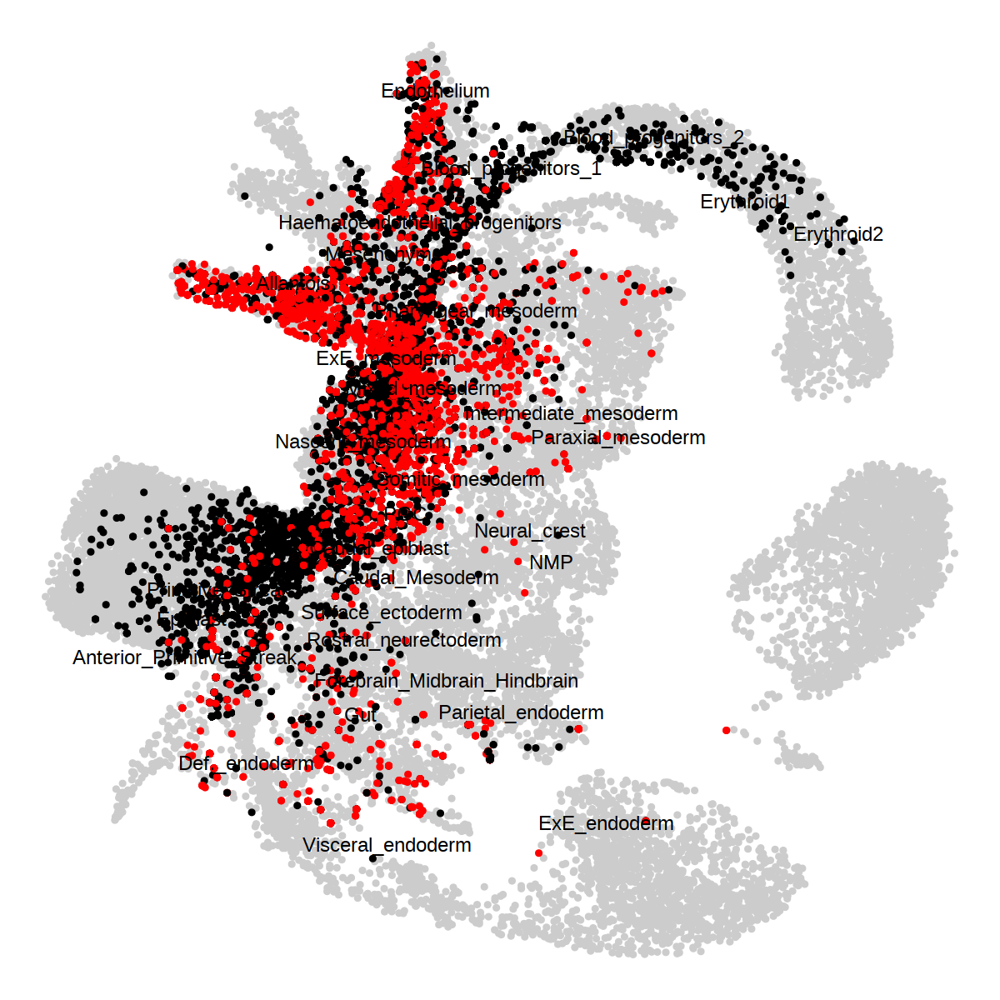

In [214]:
ggplot(umap_projection, aes(umapX, umapY, col=genotype)) + 
    geom_point(data=atlas_umap[sample(nrow(atlas_umap), 20000)], col='grey80') + # now we sample a random subset of 20k cells from the atlas so we don't have to load too much data
    geom_point() +
    ggrepel::geom_text_repel(data=labels, aes(meanumapX, meanumapY, label=celltype), # we didn't load the package ggrepel, but can still use a specific function of it if we add ggrepel:: in front of it
                             col='black', 
                             size=5) + 
    scale_color_manual(values=c('wt'='black', 'eomes_ko'='red')) + 
    theme_void() + 
    theme(legend.position='none')

I think this will have covered most of the basics.

Let's explore our transcriptomes

### SingleCellExperiment

In [201]:
suppressPackageStartupMessages({ # this first line makes sure you don't get all the start up messages
    library(SingleCellExperiment) # package we use for scRNA-seq
    library(scran) # these 2 following packages are used for all kinds of scRNA-seq calculations
    library(scater)
    library(ggpubr) # for plotting
})

In [148]:
# io$rna_sce is a singlecellexperiment object, which is specifically made to store all the things we would want
# it is stored as an .rds file, which we can open like this:
sce = readRDS(io$rna_sce)

In [154]:
# an object is a more complex structure than a regular data.table
# in an object, you can store all kind of different stuff, like count matrices, metadata, etc, etc.
# most packages create their own object that contains all the information they need

In [149]:
# genes are rows, cells are columns
# so 32285 genes and 41852 cells in this dataset
sce

class: SingleCellExperiment 
dim: 32285 41852 
metadata(0):
assays(1): counts
rownames(32285): Xkr4 Gm1992 ... AC234645.1 AC149090.1
rowData names(0):
colnames(41852): rv_eo_deg_day3_5_control#AAACAGCCAAACCTTG-1
  rv_eo_deg_day3_5_control#AAACAGCCAGCAACCT-1 ...
  2_Eo_DEG_G9_day5_VC#TTTGTGTTCACAGCCA-1
  2_Eo_DEG_G9_day5_VC#TTTGTTGGTACCGGAT-1
colData names(11): barcode sample ... pass_rnaQC sizeFactor
reducedDimNames(0):
mainExpName: RNA
altExpNames(0):

In [150]:
# using str() you can take a deeper look into the object
str(sce)

Formal class 'SingleCellExperiment' [package "SingleCellExperiment"] with 9 slots
  ..@ int_elementMetadata:Formal class 'DFrame' [package "S4Vectors"] with 6 slots
  .. .. ..@ rownames       : NULL
  .. .. ..@ nrows          : int 32285
  .. .. ..@ listData       :List of 1
  .. .. .. ..$ rowPairs:Formal class 'DFrame' [package "S4Vectors"] with 6 slots
  .. .. .. .. .. ..@ rownames       : NULL
  .. .. .. .. .. ..@ nrows          : int 32285
  .. .. .. .. .. ..@ listData       : Named list()
  .. .. .. .. .. ..@ elementType    : chr "ANY"
  .. .. .. .. .. ..@ elementMetadata: NULL
  .. .. .. .. .. ..@ metadata       : list()
  .. .. ..@ elementType    : chr "ANY"
  .. .. ..@ elementMetadata: NULL
  .. .. ..@ metadata       : list()
  ..@ int_colData        :Formal class 'DFrame' [package "S4Vectors"] with 6 slots
  .. .. ..@ rownames       : NULL
  .. .. ..@ nrows          : int 41852
  .. .. ..@ listData       :List of 3
  .. .. .. ..$ reducedDims:Formal class 'DFrame' [package "S4V

In [165]:
head(meta_small)

cell,day,genotype,celltype,closest.cell,Ncells
<chr>,<chr>,<chr>,<chr>,<chr>,<int>
1A_Eo_DEG_G9_day3#AAACAGCCAGCAAGAT-1,D3,wt,Epiblast,cell_85485,750
1A_Eo_DEG_G9_day3#AAACAGCCAGCACCAT-1,D3,wt,Primitive_Streak,cell_88836,4988
1A_Eo_DEG_G9_day3#AAACATGCAAGTAAGC-1,D3,wt,Epiblast,cell_1799,750
1A_Eo_DEG_G9_day3#AAACATGCAATATACC-1,D3,wt,Primitive_Streak,cell_43612,4988
1A_Eo_DEG_G9_day3#AAACATGCAATCCTGA-1,D3,wt,Epiblast,cell_106685,750
1A_Eo_DEG_G9_day3#AAACATGCACTTAGGC-1,D3,wt,Primitive_Streak,cell_28316,4988


In [166]:
# let's only keep cells that are in our metadata
sce = sce[,meta_small$cell]

In [168]:
# lets filter out genes that are not expressed in any cell
# counts(sce) contains the count matrix
# rowSums calculates the total sum for each gene across all cells
# if this is 0, the gene is never expressed
# can also put the threshold a bit higher, like 15
sce = sce[Matrix::rowSums(counts(sce)) > 15,]

# let's lognormalise
sce <- logNormCounts(sce)

In [169]:
# now the object contains two matrices, one raw, one lognormalised
sce
# notice how gene and cell numbers are smaller

class: SingleCellExperiment 
dim: 23004 38346 
metadata(0):
assays(2): counts logcounts
rownames(23004): Xkr4 Gm1992 ... CAAA01147332.1 AC149090.1
rowData names(0):
colnames(38346): 1A_Eo_DEG_G9_day3#AAACAGCCAGCAAGAT-1
  1A_Eo_DEG_G9_day3#AAACAGCCAGCACCAT-1 ...
  rv_eo_deg_day4_dtag#TTTGTGTTCATTTGTC-1
  rv_eo_deg_day4_dtag#TTTGTTGGTACTTAGG-1
colData names(11): barcode sample ... pass_rnaQC sizeFactor
reducedDimNames(0):
mainExpName: RNA
altExpNames(0):

In [170]:
# the matrices look like this:
head(logcounts(sce))
# Note that most expression values are . (0), because of the data sparsity

   [[ suppressing 34 column names ‘1A_Eo_DEG_G9_day3#AAACAGCCAGCAAGAT-1’, ‘1A_Eo_DEG_G9_day3#AAACAGCCAGCACCAT-1’, ‘1A_Eo_DEG_G9_day3#AAACATGCAAGTAAGC-1’ ... ]]



6 x 38346 sparse Matrix of class "dgCMatrix"
                                                                        
Xkr4    1.41785 2.189095 3.076152 2.787487 1.313398 2.416914 1.92912 . .
Gm1992  .       .        1.314246 .        .        .        .       . .
Gm19938 .       1.128776 1.314246 .        .        .        .       . .
Gm37381 .       .        .        .        .        .        .       . .
Rp1     .       .        .        .        .        .        .       . .
Sox17   .       .        .        .        .        .        .       . .
                                                                           
Xkr4    0.8251777 1.945711 . . 2.224763 1.475108 . 1.811626 . . 1.8124385 .
Gm1992  .         .        . . .        .        . .        . . .         .
Gm19938 .         .        . . .        .        . .        . . .         .
Gm37381 .         .        . . .        .        . .        . . .         .
Rp1     .         .        . . .        .        . .        . . 

In [182]:
# let's plot the expression of a specific gene on our UMAP\
gene = 'Eomes'
gene_expr = as.vector(logcounts(sce[gene])) # filters out values of gene and converts to vector

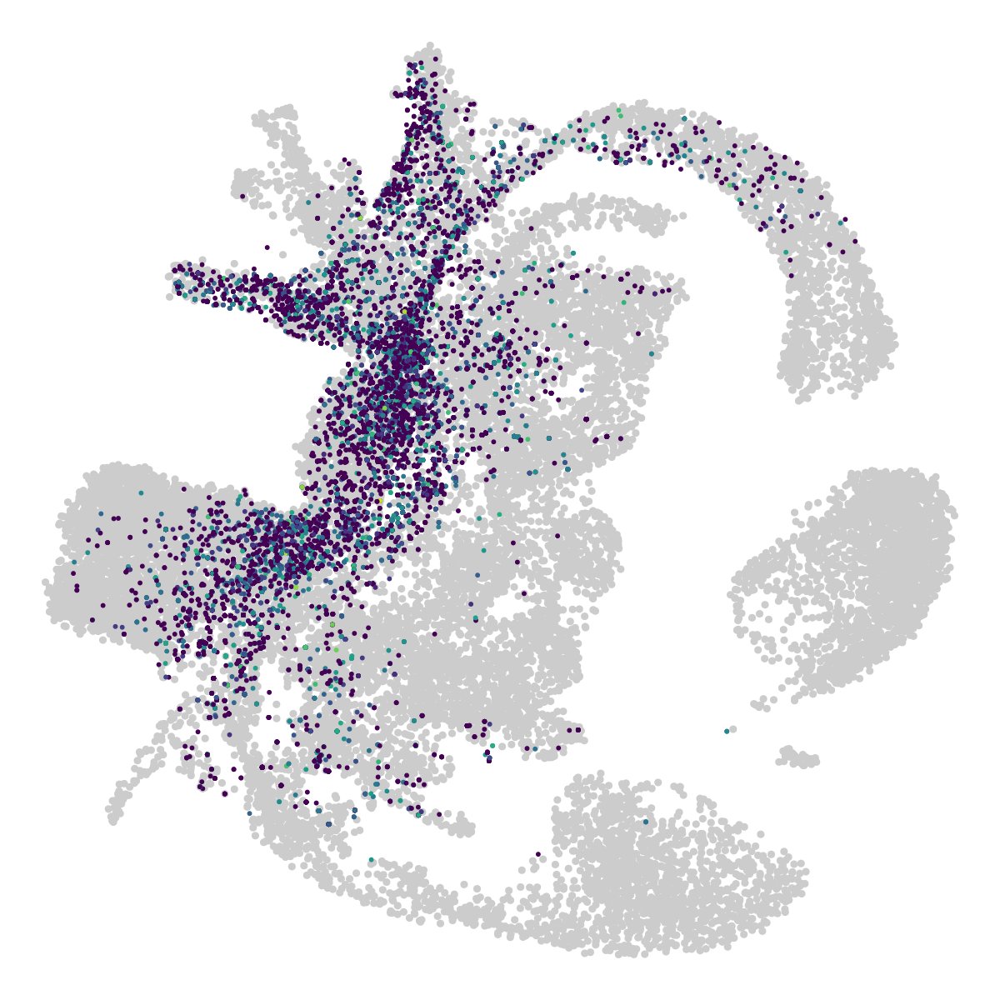

In [183]:
ggplot(umap_projection, aes(umapX, umapY, col=gene_expr)) + # color by gene expression
    geom_point(data=atlas_umap[sample(nrow(atlas_umap), 20000)], col='grey80') + # will automatically use the aes from above, have to overwrite the color to gray
    geom_point(size = 0.6) + # making dots slightly smaller to visualise better
    viridis::scale_color_viridis() +  # viridis is the color scale we're using here
    theme_void() + 
    theme(legend.position='none')

In [188]:
# This result doesn't make sense, so we made a mistake

# this is likely because the order of cells in the umap_projection is different than in the sce object, let's check this
summary(umap_projection$cell == colnames(sce))

# Yep so we have to change the order the of the umap_projection in to the same one as colnames(sce)
umap_projection = umap_projection[match(colnames(sce), umap_projection$cell)]

   Mode   FALSE 
logical   38346 

In [191]:
summary(umap_projection$cell == colnames(sce))

   Mode    TRUE 
logical   38346 

In [198]:
#Let's see if it is fixed, but first: 

# if we want to plot a lot of genes, we can try to write what we did into a function that we can keep calling:
plot_umap = function(gene){ # gene is the variable we have to supply
    gene_expr = as.vector(logcounts(sce[gene])) # filters out values of gene and converts to vector
    p = ggplot(umap_projection, aes(umapX, umapY, col=gene_expr)) + # color by gene expression
            geom_point(data=atlas_umap[sample(nrow(atlas_umap), 20000)], col='grey80') + # will automatically use the aes from above, have to overwrite the color to gray
            geom_point(size = 0.6) + # making dots slightly smaller to visualise better
            viridis::scale_color_viridis() +  # viridis is the color scale we're using here
            ggtitle(gene) + # let's add the gene name as the plot title
            theme_void() + 
            theme(legend.position='none',
                  plot.title= element_text(size=40))
    
    return(p)
}

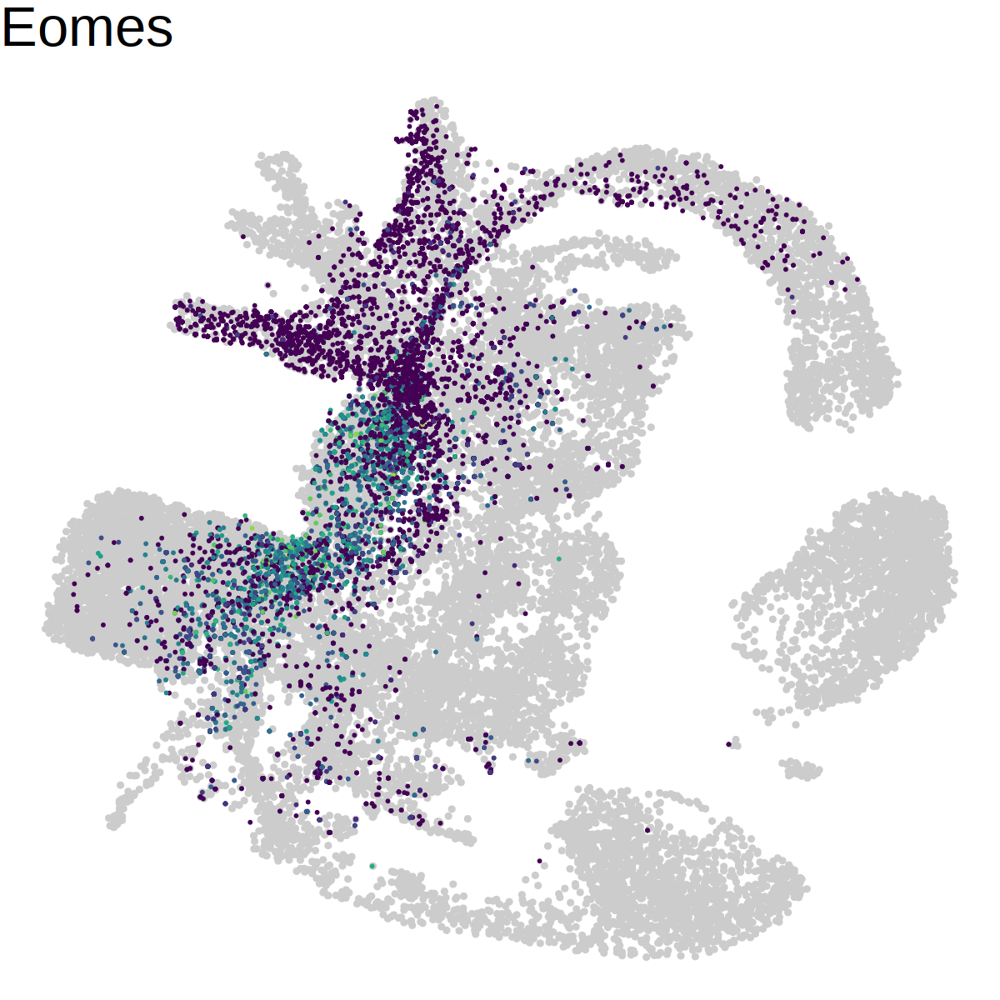

In [199]:
plot_umap('Eomes')

In [215]:
# I guess I hadn't looked at this yet but it looks like in vitro the first wave doesn't express Eomes, this is different than in vivo

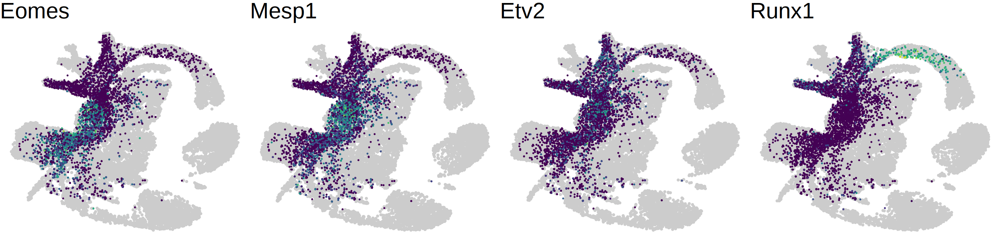

In [204]:
# We can put multiple plots next to each other
options(repr.plot.width=25, repr.plot.height=6)

ggarrange(plot_umap('Eomes'), plot_umap('Mesp1'), plot_umap('Etv2'), plot_umap('Runx1'), ncol=4)

$`1`

$`2`

attr(,"class")
[1] "list"      "ggarrange"

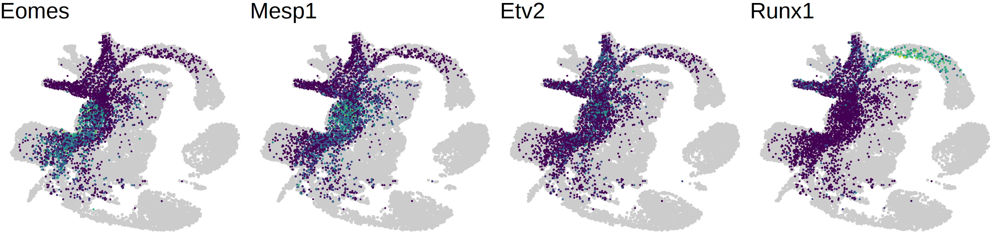

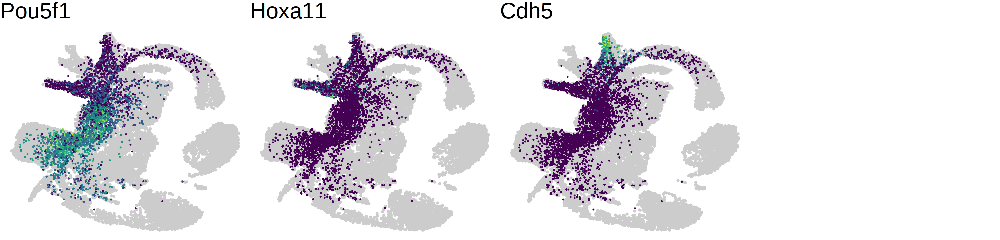

In [220]:
# a better way to do this is to write all the plots to a list using lapply
genes_to_plot = c('Eomes', 'Mesp1','Etv2', 'Runx1', 'Pou5f1', 'Hoxa11', 'Cdh5')
plots = lapply(genes_to_plot, plot_umap) # lapply uses every gene in the genes_to_plot as an input for the function plot_umap, and writes it as an entry to the list plots
ggarrange(plotlist=plots, ncol=4)

In [237]:
# We can also plot this on the UMAP from the data itself, rather than the projection
ATAC_umap = fread(file.path(io$main, "results/atac/archR/dimensionality_reduction/cells/PeakMatrix/remove_ExE_cells_FALSE/batch_correction_None/umap_nfeatures25000_dims25_nneighbour35_mindist0.5.txt.gz"))

# There are fewer cells in the ATAC dataset, because not all cells passed RNA and ATAC, so I will subset the sce to only those cells that are present in the atac umap
sce_subset = sce[,ATAC_umap$cell]

In [240]:
# again, make sure the row order is the same 
ATAC_umap = ATAC_umap[match(colnames(sce_subset), ATAC_umap$cell)]

In [241]:
summary(ATAC_umap$cell == colnames(sce_subset))

   Mode    TRUE 
logical   33177 

In [248]:
plot_umap_ATAC = function(gene){ # gene is the variable we have to supply
    gene_expr = as.vector(logcounts(sce_subset[gene])) # filters out values of gene and converts to vector
    p = ggplot(ATAC_umap, aes(umap1, umap2, col=gene_expr)) + 
            geom_point(size = 0.6) + 
            viridis::scale_color_viridis() +  
            ggtitle(gene) + 
            theme_void() + 
            theme(legend.position='none',
                  plot.title= element_text(size=40))
    
    return(p)
}

$`1`

$`2`

attr(,"class")
[1] "list"      "ggarrange"

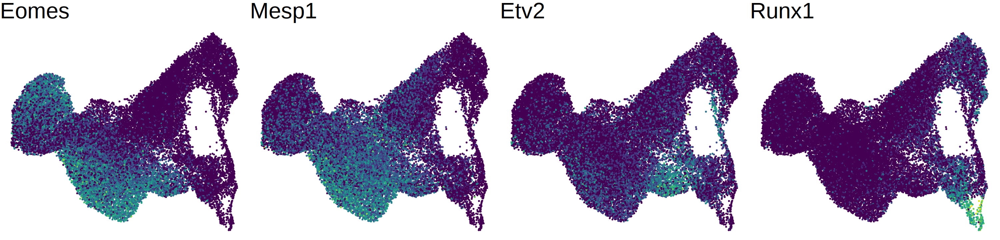

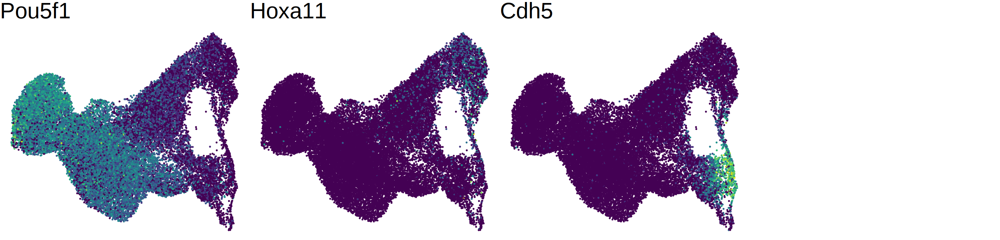

In [249]:
# a better way to do this is to write all the plots to a list using lapply
genes_to_plot = c('Eomes', 'Mesp1','Etv2', 'Runx1', 'Pou5f1', 'Hoxa11', 'Cdh5')
plots = lapply(genes_to_plot, plot_umap_ATAC) # lapply uses every gene in the genes_to_plot as an input for the function plot_umap, and writes it as an entry to the list plots
ggarrange(plotlist=plots, ncol=4)